<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">


# Table of Contents
* Install Detectron2 dependencies
* Download custom Detectron2 object detection data
* Visualize Detectron2 training data
* Write our Detectron2 Training configuration
* Run Detectron2 training
* Evaluate Detectron2 performance
* Run Detectron2 inference on test images

# Install Detectron2 Dependencies

In [1]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-yqe293mm
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-yqe293mm
  Resolved https://github.com/facebookresearch/detectron2.git to commit 80307d2d5e06f06a8a677cc2653f23a4c56402ac
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 13.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for detectron2: filename=detectron2-0.6-cp310-cp310-linux_x86_64.whl size=6112297 sha256=f9125eb23df3fe02c03279bc55b414cb

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  2.0 ; cuda:  cu118
detectron2: 0.6


In [3]:
# COMMON LIBRARIES
import os
import cv2
import random

from datetime import datetime
from google.colab.patches import cv2_imshow

# DATA SET PREPARATION AND LOADING
from detectron2.data.datasets import register_coco_instances
from detectron2.data import DatasetCatalog, MetadataCatalog

# VISUALIZATION
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode

# CONFIGURATION
from detectron2 import model_zoo
from detectron2.config import get_cfg

# EVALUATION
from detectron2.engine import DefaultPredictor

# TRAINING
from detectron2.engine import DefaultTrainer

# Import and Register Custom Detectron2 Data

In [4]:
import subprocess

curl_command = 'curl -L "https://universe.roboflow.com/ds/tJizjLUWIf?key=UeQlkg5jsg" > roboflow.zip'
unzip_command = 'unzip roboflow.zip'
cleanup_command = 'rm roboflow.zip'

subprocess.run(curl_command, shell=True)
subprocess.run(unzip_command, shell=True)
subprocess.run(cleanup_command, shell=True)

CompletedProcess(args='rm roboflow.zip', returncode=0)

In [5]:
from detectron2.data.datasets import register_coco_instances

# Register training dataset
train_annotations_path = "/content/train/_annotations.coco.json"
train_image_root = "/content/train"
register_coco_instances("my_dataset_train", {}, train_annotations_path, train_image_root)

# Register validation dataset
val_annotations_path = "/content/valid/_annotations.coco.json"
val_image_root = "/content/valid"
register_coco_instances("my_dataset_val", {}, val_annotations_path, val_image_root)

# Register test dataset
test_annotations_path = "/content/test/_annotations.coco.json"
test_image_root = "/content/test"
register_coco_instances("my_dataset_test", {}, test_annotations_path, test_image_root)


In [6]:
[
    data_set
    for data_set
    in MetadataCatalog.list()

]

['coco_2014_train',
 'coco_2014_val',
 'coco_2014_minival',
 'coco_2014_valminusminival',
 'coco_2017_train',
 'coco_2017_val',
 'coco_2017_test',
 'coco_2017_test-dev',
 'coco_2017_val_100',
 'keypoints_coco_2014_train',
 'keypoints_coco_2014_val',
 'keypoints_coco_2014_minival',
 'keypoints_coco_2014_valminusminival',
 'keypoints_coco_2017_train',
 'keypoints_coco_2017_val',
 'keypoints_coco_2017_val_100',
 'coco_2017_train_panoptic_separated',
 'coco_2017_train_panoptic_stuffonly',
 'coco_2017_train_panoptic',
 'coco_2017_val_panoptic_separated',
 'coco_2017_val_panoptic_stuffonly',
 'coco_2017_val_panoptic',
 'coco_2017_val_100_panoptic_separated',
 'coco_2017_val_100_panoptic_stuffonly',
 'coco_2017_val_100_panoptic',
 'lvis_v1_train',
 'lvis_v1_val',
 'lvis_v1_test_dev',
 'lvis_v1_test_challenge',
 'lvis_v0.5_train',
 'lvis_v0.5_val',
 'lvis_v0.5_val_rand_100',
 'lvis_v0.5_test',
 'lvis_v0.5_train_cocofied',
 'lvis_v0.5_val_cocofied',
 'cityscapes_fine_instance_seg_train',
 'city

Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



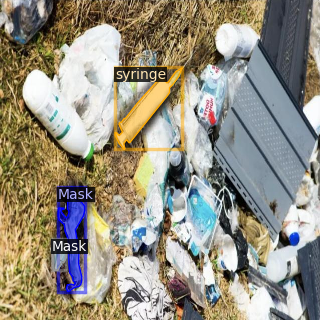

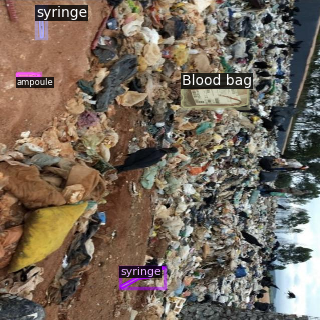

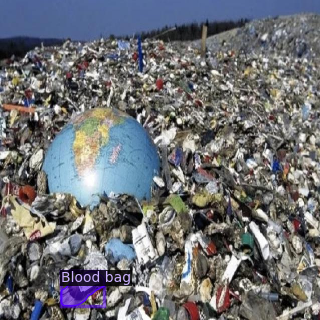

In [7]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Train Custom Detectron2 Detector

In [8]:
# Create the configuration object
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")

# Set training parameters
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 4000
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05

# Set model parameters
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 6  # Your number of classes + 1

# Set evaluation parameters
cfg.TEST.EVAL_PERIOD = 500

# Create output directory if it doesn't exist
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# Initialize and train the model
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()


[08/30 23:53:22 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
model_final_68b088.pkl: 421MB [00:01, 224MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[08/30 23:53:24 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[08/30 23:54:13 d2.utils.events]:  eta: 2:28:18  iter: 19  total_loss: 2.725  loss_cls: 1.893  loss_box_reg: 0.5327  loss_rpn_cls: 0.31  loss_rpn_loc: 0.0374    time: 2.2436  last_time: 2.0872  data_time: 0.0414  last_data_time: 0.0252   lr: 1.931e-06  max_mem: 6855M
[08/30 23:55:03 d2.utils.events]:  eta: 2:30:22  iter: 39  total_loss: 2.904  loss_cls: 1.848  loss_box_reg: 0.5424  loss_rpn_cls: 0.4114  loss_rpn_loc: 0.04943    time: 2.2868  last_time: 2.1609  data_time: 0.0200  last_data_time: 0.0139   lr: 2.911e-06  max_mem: 6856M
[08/30 23:55:50 d2.utils.events]:  eta: 2:31:39  iter: 59  total_loss: 2.743  loss_cls: 1.782  loss_box_reg: 0.622  loss_rpn_cls: 0.3073  loss_rpn_loc: 0.04278    time: 2.3153  last_time: 2.6709  data_time: 0.0239  last_data_time: 0.0258   lr: 3.891e-06  max_mem: 6856M
[08/30 23:56:39 d2.utils.events]:  eta: 2:33:49  iter: 79  total_loss: 2.531  loss_cls: 1.709  loss_box_reg: 0.4862  loss_rpn_cls: 0.2681  loss_rpn_loc: 0.05228    time: 2.3415  last_time: 2.

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[08/31 00:15:08 d2.utils.events]:  eta: 2:26:45  iter: 519  total_loss: 1.669  loss_cls: 0.7976  loss_box_reg: 0.7692  loss_rpn_cls: 0.06974  loss_rpn_loc: 0.04021    time: 2.4929  last_time: 2.6629  data_time: 0.0236  last_data_time: 0.0161   lr: 2.6431e-05  max_mem: 6857M
[08/31 00:15:57 d2.utils.events]:  eta: 2:25:33  iter: 539  total_loss: 1.614  loss_cls: 0.736  loss_box_reg: 0.7992  loss_rpn_cls: 0.06307  loss_rpn_loc: 0.02896    time: 2.4928  last_time: 2.0562  data_time: 0.0225  last_data_time: 0.0223   lr: 2.7411e-05  max_mem: 6857M
[08/31 00:16:48 d2.utils.events]:  eta: 2:25:03  iter: 559  total_loss: 1.664  loss_cls: 0.76  loss_box_reg: 0.7892  loss_rpn_cls: 0.09662  loss_rpn_loc: 0.04872    time: 2.4946  last_time: 2.3994  data_time: 0.0247  last_data_time: 0.0099   lr: 2.8391e-05  max_mem: 6857M
[08/31 00:17:39 d2.utils.events]:  eta: 2:24:13  iter: 579  total_loss: 1.702  loss_cls: 0.7579  loss_box_reg: 0.8476  loss_rpn_cls: 0.06535  loss_rpn_loc: 0.02922    time: 2.496

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[08/31 00:36:01 d2.utils.events]:  eta: 2:11:33  iter: 1019  total_loss: 1.389  loss_cls: 0.5257  loss_box_reg: 0.806  loss_rpn_cls: 0.0487  loss_rpn_loc: 0.02864    time: 2.4993  last_time: 2.0458  data_time: 0.0265  last_data_time: 0.0223   lr: 5e-05  max_mem: 6857M
[08/31 00:36:51 d2.utils.events]:  eta: 2:10:45  iter: 1039  total_loss: 1.327  loss_cls: 0.491  loss_box_reg: 0.7837  loss_rpn_cls: 0.03943  loss_rpn_loc: 0.02772    time: 2.4988  last_time: 2.4022  data_time: 0.0231  last_data_time: 0.0090   lr: 5e-05  max_mem: 6857M
[08/31 00:37:40 d2.utils.events]:  eta: 2:09:57  iter: 1059  total_loss: 1.496  loss_cls: 0.5815  loss_box_reg: 0.8032  loss_rpn_cls: 0.0436  loss_rpn_loc: 0.04161    time: 2.4985  last_time: 2.7127  data_time: 0.0266  last_data_time: 0.0515   lr: 5e-05  max_mem: 6857M
[08/31 00:38:30 d2.utils.events]:  eta: 2:09:04  iter: 1079  total_loss: 1.307  loss_cls: 0.4719  loss_box_reg: 0.7748  loss_rpn_cls: 0.04586  loss_rpn_loc: 0.03975    time: 2.4981  last_time

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[08/31 00:56:42 d2.utils.events]:  eta: 1:49:31  iter: 1519  total_loss: 1.057  loss_cls: 0.3571  loss_box_reg: 0.6561  loss_rpn_cls: 0.0303  loss_rpn_loc: 0.03536    time: 2.4932  last_time: 2.4220  data_time: 0.0205  last_data_time: 0.0249   lr: 2.5e-06  max_mem: 6857M
[08/31 00:57:32 d2.utils.events]:  eta: 1:48:37  iter: 1539  total_loss: 1.111  loss_cls: 0.3411  loss_box_reg: 0.6939  loss_rpn_cls: 0.0306  loss_rpn_loc: 0.02937    time: 2.4933  last_time: 2.4075  data_time: 0.0267  last_data_time: 0.0097   lr: 2.5e-06  max_mem: 6857M
[08/31 00:58:22 d2.utils.events]:  eta: 1:47:44  iter: 1559  total_loss: 1.083  loss_cls: 0.3355  loss_box_reg: 0.6234  loss_rpn_cls: 0.03008  loss_rpn_loc: 0.03346    time: 2.4936  last_time: 2.6744  data_time: 0.0252  last_data_time: 0.0283   lr: 2.5e-06  max_mem: 6857M
[08/31 00:59:12 d2.utils.events]:  eta: 1:46:51  iter: 1579  total_loss: 1.065  loss_cls: 0.3768  loss_box_reg: 0.6279  loss_rpn_cls: 0.03155  loss_rpn_loc: 0.03102    time: 2.4934  l

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[08/31 01:17:32 d2.utils.events]:  eta: 1:27:23  iter: 2019  total_loss: 1.023  loss_cls: 0.329  loss_box_reg: 0.6648  loss_rpn_cls: 0.02825  loss_rpn_loc: 0.02324    time: 2.4948  last_time: 2.6706  data_time: 0.0250  last_data_time: 0.0249   lr: 2.5e-06  max_mem: 6857M
[08/31 01:18:23 d2.utils.events]:  eta: 1:26:32  iter: 2039  total_loss: 1.105  loss_cls: 0.3915  loss_box_reg: 0.6408  loss_rpn_cls: 0.0259  loss_rpn_loc: 0.025    time: 2.4953  last_time: 2.6586  data_time: 0.0245  last_data_time: 0.0088   lr: 2.5e-06  max_mem: 6857M
[08/31 01:19:12 d2.utils.events]:  eta: 1:25:37  iter: 2059  total_loss: 1.131  loss_cls: 0.3824  loss_box_reg: 0.6359  loss_rpn_cls: 0.03245  loss_rpn_loc: 0.04122    time: 2.4948  last_time: 2.6731  data_time: 0.0226  last_data_time: 0.0168   lr: 2.5e-06  max_mem: 6857M
[08/31 01:20:01 d2.utils.events]:  eta: 1:24:44  iter: 2079  total_loss: 1.066  loss_cls: 0.3407  loss_box_reg: 0.6174  loss_rpn_cls: 0.02894  loss_rpn_loc: 0.02863    time: 2.4946  las

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[08/31 01:38:22 d2.utils.events]:  eta: 1:05:21  iter: 2519  total_loss: 1.057  loss_cls: 0.3609  loss_box_reg: 0.597  loss_rpn_cls: 0.02658  loss_rpn_loc: 0.03254    time: 2.4957  last_time: 2.6714  data_time: 0.0232  last_data_time: 0.0186   lr: 2.5e-06  max_mem: 6857M
[08/31 01:39:14 d2.utils.events]:  eta: 1:04:30  iter: 2539  total_loss: 0.9941  loss_cls: 0.3469  loss_box_reg: 0.6102  loss_rpn_cls: 0.0287  loss_rpn_loc: 0.03938    time: 2.4966  last_time: 2.6783  data_time: 0.0244  last_data_time: 0.0283   lr: 2.5e-06  max_mem: 6857M
[08/31 01:40:04 d2.utils.events]:  eta: 1:03:36  iter: 2559  total_loss: 1.117  loss_cls: 0.3589  loss_box_reg: 0.6851  loss_rpn_cls: 0.0292  loss_rpn_loc: 0.03435    time: 2.4964  last_time: 2.4088  data_time: 0.0282  last_data_time: 0.0341   lr: 2.5e-06  max_mem: 6857M
[08/31 01:40:53 d2.utils.events]:  eta: 1:02:43  iter: 2579  total_loss: 1.027  loss_cls: 0.324  loss_box_reg: 0.6188  loss_rpn_cls: 0.03142  loss_rpn_loc: 0.03575    time: 2.4964  la

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[08/31 01:59:17 d2.utils.events]:  eta: 0:43:18  iter: 3019  total_loss: 0.989  loss_cls: 0.3439  loss_box_reg: 0.5927  loss_rpn_cls: 0.02935  loss_rpn_loc: 0.03597    time: 2.4979  last_time: 2.4103  data_time: 0.0260  last_data_time: 0.0173   lr: 2.5e-06  max_mem: 6857M
[08/31 02:00:06 d2.utils.events]:  eta: 0:42:25  iter: 3039  total_loss: 1.024  loss_cls: 0.3332  loss_box_reg: 0.6047  loss_rpn_cls: 0.03064  loss_rpn_loc: 0.02701    time: 2.4978  last_time: 2.6643  data_time: 0.0253  last_data_time: 0.0172   lr: 2.5e-06  max_mem: 6857M
[08/31 02:00:57 d2.utils.events]:  eta: 0:41:32  iter: 3059  total_loss: 0.9933  loss_cls: 0.3298  loss_box_reg: 0.6618  loss_rpn_cls: 0.02688  loss_rpn_loc: 0.02761    time: 2.4979  last_time: 2.6562  data_time: 0.0260  last_data_time: 0.0222   lr: 2.5e-06  max_mem: 6857M
[08/31 02:01:45 d2.utils.events]:  eta: 0:40:39  iter: 3079  total_loss: 1.06  loss_cls: 0.3528  loss_box_reg: 0.6342  loss_rpn_cls: 0.02716  loss_rpn_loc: 0.0295    time: 2.4972  

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[08/31 02:20:01 d2.utils.events]:  eta: 0:21:11  iter: 3519  total_loss: 1.003  loss_cls: 0.345  loss_box_reg: 0.6165  loss_rpn_cls: 0.02546  loss_rpn_loc: 0.04513    time: 2.4965  last_time: 2.2694  data_time: 0.0234  last_data_time: 0.0367   lr: 2.5e-06  max_mem: 6857M
[08/31 02:20:52 d2.utils.events]:  eta: 0:20:18  iter: 3539  total_loss: 0.9535  loss_cls: 0.3244  loss_box_reg: 0.5875  loss_rpn_cls: 0.03052  loss_rpn_loc: 0.03589    time: 2.4966  last_time: 2.0650  data_time: 0.0252  last_data_time: 0.0318   lr: 2.5e-06  max_mem: 6857M
[08/31 02:21:42 d2.utils.events]:  eta: 0:19:25  iter: 3559  total_loss: 0.9777  loss_cls: 0.3255  loss_box_reg: 0.6127  loss_rpn_cls: 0.02602  loss_rpn_loc: 0.02733    time: 2.4968  last_time: 2.0606  data_time: 0.0219  last_data_time: 0.0227   lr: 2.5e-06  max_mem: 6857M
[08/31 02:22:31 d2.utils.events]:  eta: 0:18:33  iter: 3579  total_loss: 0.9915  loss_cls: 0.31  loss_box_reg: 0.6226  loss_rpn_cls: 0.03316  loss_rpn_loc: 0.03287    time: 2.4966 

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


## Inference & evaluation using the trained model

In [10]:
directory_path = "./output/"
os.listdir(directory_path)

['last_checkpoint',
 'events.out.tfevents.1693439656.51ba7f3f8e06.424.0',
 'metrics.json',
 'model_final.pth']

In [11]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[08/31 02:42:10 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
WARNING [08/31 02:42:11 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [08/31 02:42:11 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/31 02:42:11 d2.data.datasets.coco]: Loaded 25 images in COCO format from /content/test/_annotations.coco.json
[08/31 02:42:11 d2.data.build]: Distribution of instances among all 5 categories:
|   category    | #instances   |  category  | #instances   |  category  | #instances   |
|:-------------:|:-------------|:----------:|:-------------|:----------:|:-------------|
| medical-waste | 0            | Blood bag  | 17           |    Mask    | 20           |
|    ampoule    | 43           |  syringe   | 60           |            |              |
|     total     | 140

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[08/31 02:42:13 d2.evaluation.evaluator]: Inference done 11/25. Dataloading: 0.0031 s/iter. Inference: 0.1916 s/iter. Eval: 0.0004 s/iter. Total: 0.1952 s/iter. ETA=0:00:02
[08/31 02:42:16 d2.evaluation.evaluator]: Total inference time: 0:00:04.027400 (0.201370 s / iter per device, on 1 devices)
[08/31 02:42:16 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:03 (0.192499 s / iter per device, on 1 devices)
[08/31 02:42:16 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[08/31 02:42:16 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[08/31 02:42:16 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[08/31 02:42:16 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[08/31 02:42:16 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.03 seconds.
[08/31 02:42:16 d2.evaluation.

OrderedDict([('bbox',
              {'AP': 21.431486419821216,
               'AP50': 44.456475542007624,
               'AP75': 17.78987395792518,
               'APs': 25.650268931211397,
               'APm': 23.523130600871077,
               'APl': 22.230404294320888,
               'AP-medical-waste': nan,
               'AP-Blood bag': 24.41779729318138,
               'AP-Mask': 32.72386300021417,
               'AP-ampoule': 12.024852491350767,
               'AP-syringe': 16.559432894538524})])

In [12]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

[08/31 02:42:47 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


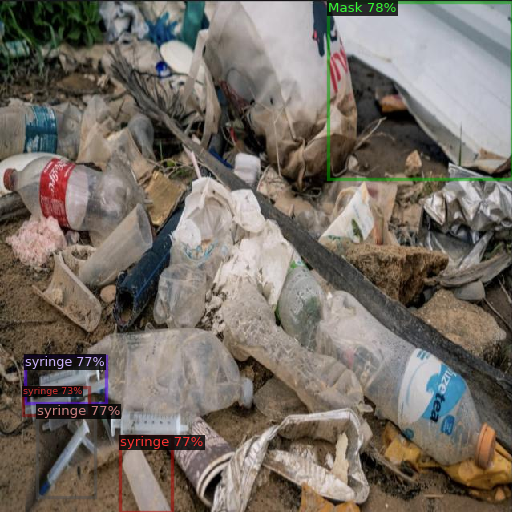

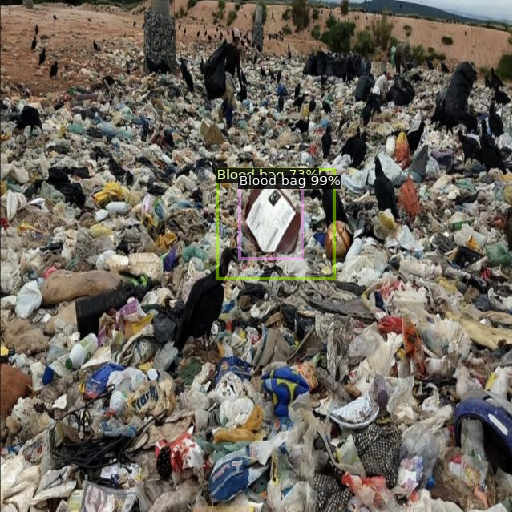

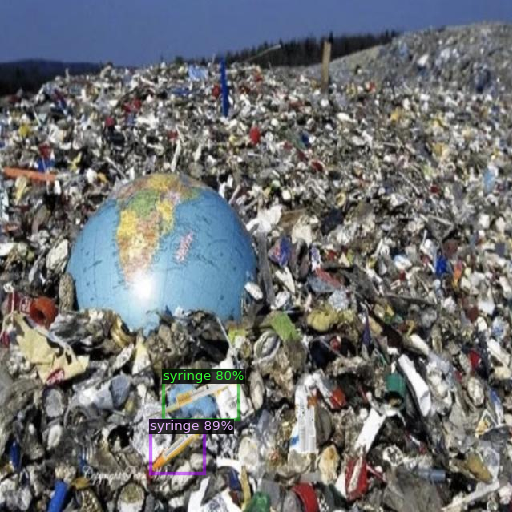

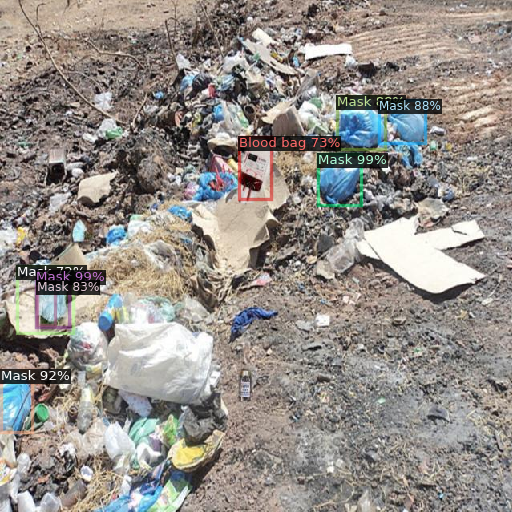

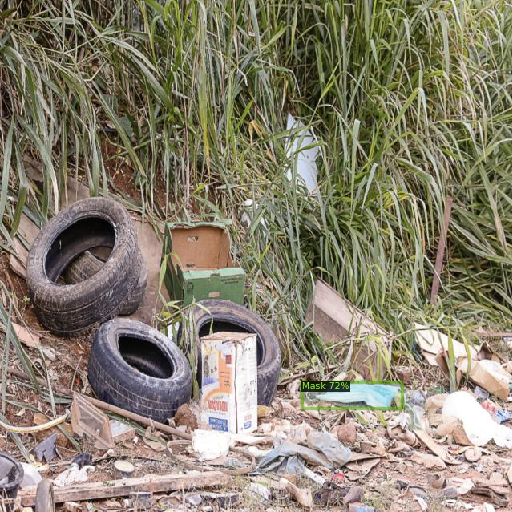

...

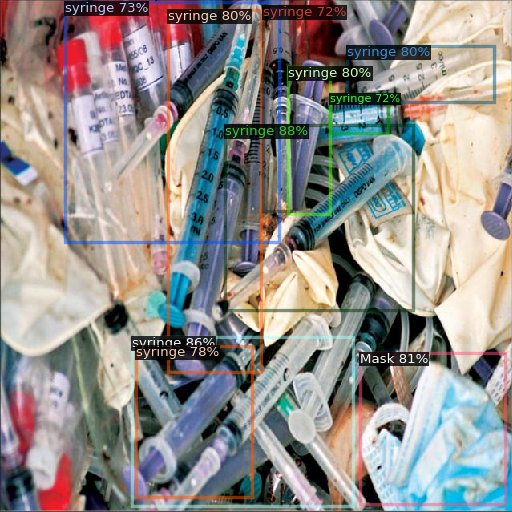

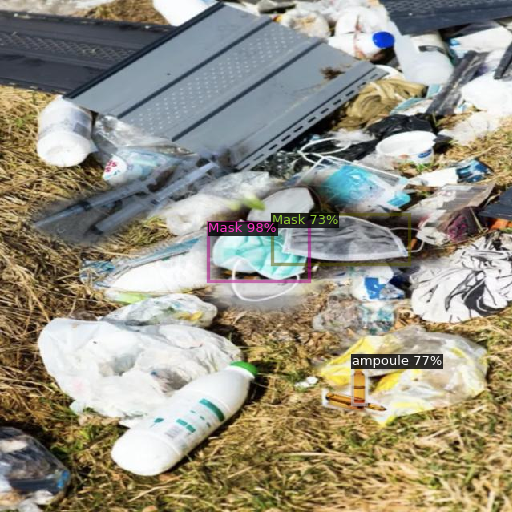

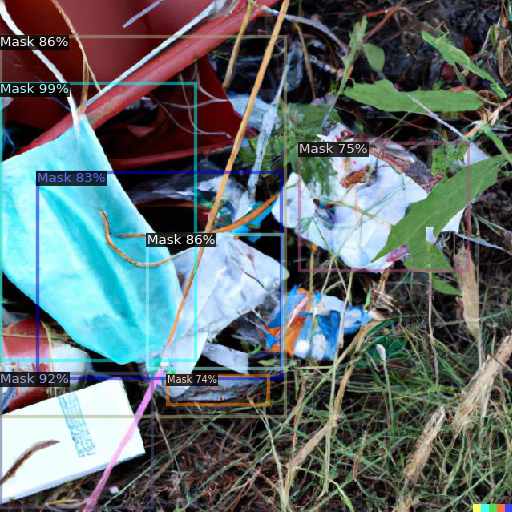

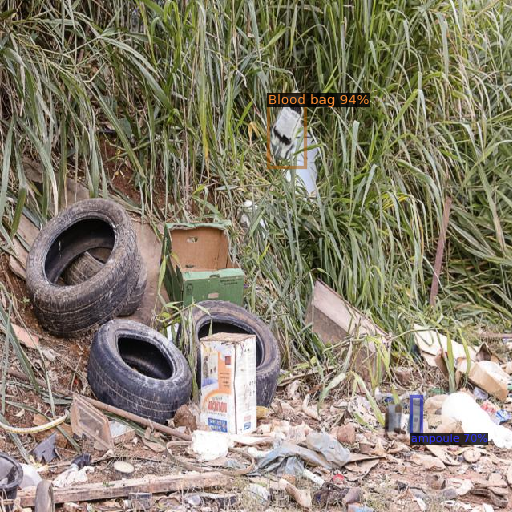

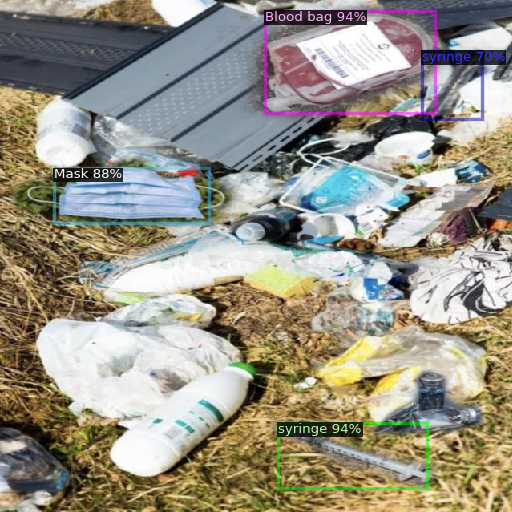

In [13]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata,
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
